In [1]:
using ApproxFun, Plots

In this notebook, we numerically compute with Galerkin orthogonal polynomials.

If $H$ is a separable Hilbert space and ${\cal B} \in \mathbb{C}^{\nu\times\infty}$ contains $\nu$ linear functional constraints, then the Galerkin orthogonal polynomials are those orthogonal polynomials with respect to
$$H_{\cal B} := \{ u \in H : {\cal B}u = 0 \}.$$
For example, if $H = L^2([-1,1])$ and we wish to enforce that $u(-1) = u'(-1) = u'(1) = 0$, then the 2-normalized orthonormal polynomials may be created by taking the $QR$ factorization of the connection coefficients between the normalized Legendre polynomials $\sqrt{n+\frac{1}{2}}P_n(x)$ and a degree-graded polynomial basis that satisfies the constraints.

In [2]:
N = 501

NS = NormalizedLegendre()
B = [Evaluation(NS, -1, 0); Evaluation(NS, -1, 1); Evaluation(NS, 1, 1)]
ν = size(B, 1)
QS = QuotientSpace(B)
A = Conversion(QS, NS)
Q, R = qr(A[1:N+ν,1:N])

p = Vector{Fun}(undef, N)
for n = 1:N
    en = [zeros(n-1);1.0;zeros(N+ν-n)]
    p[n] = Conversion(NS, Legendre())*Fun(NS, (Q*en)[1:n+ν])
    pad!(p[n], 3n+50)
end

The mass matrix $M\in\mathbb{R}^{N\times N}$ with entries
$$M_{i,j} = \int_{-1}^1 p_i(x)p_j(x) {\rm\,d}x = \delta_{i,j},$$
is numerically the identity, as we expect.

In [3]:
M = [innerproduct(p[i], p[j]) for i = 1:N, j = 1:N]
@show norm(M-I) ≤ 4*norm(M)*eps()
@show opnorm(M-I) ≤ 4*sqrt(N)*opnorm(M)*eps()

norm(M - I) ≤ 4 * norm(M) * eps() = true
opnorm(M - I) ≤ 4 * sqrt(N) * opnorm(M) * eps() = true


true

Although the polynomials now satisfy $\deg(p_n) = n+ν$ instead of $\deg(p_n) = n$, the index appears to determine the number of roots of the Galerkin orthogonal polynomials. In particular, $p_n$ has exactly $n$ roots in $(-1,1)$.

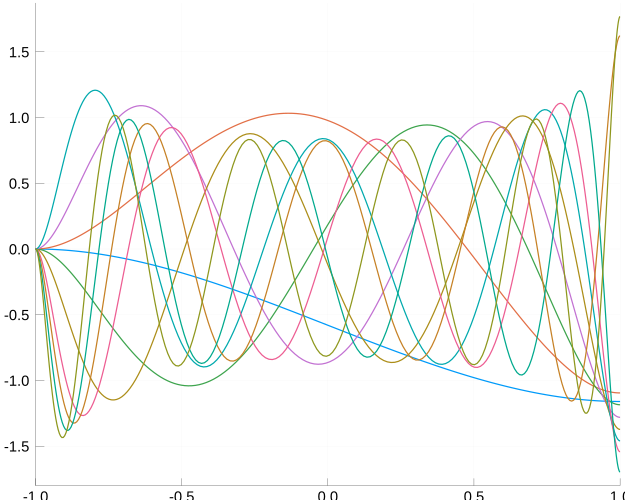

In [4]:
pl = plot(p[1]; legend = false, size = (2500, 2000), xlim = (-1,1), xtickfont = 40, ytickfont = 40, linewidth = 5)
for n in 2:10
    plot!(p[n], linewidth = 5)
end
plot(pl)

This need not be the case! If the second constraint is modified to impose $u'(0) = 0$, then the odd-index polynomials have one more root than their index and the even-index polynomials have one fewer.

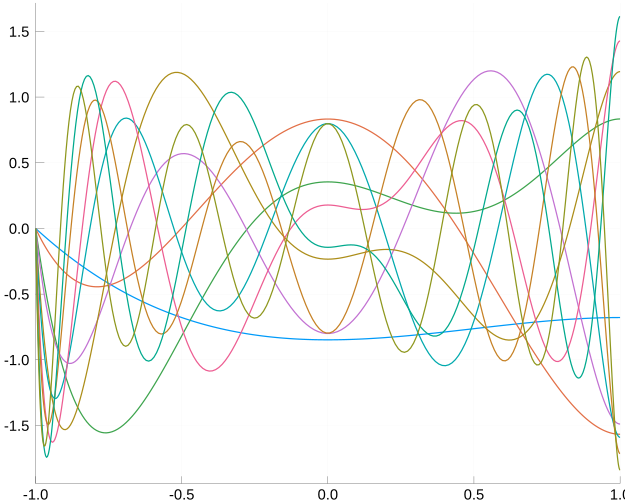

In [5]:
B = [Evaluation(NS, -1, 0); Evaluation(NS, 0, 1); Evaluation(NS, 1, 1)]
ν = size(B, 1)
QS = QuotientSpace(B)
A = Conversion(QS, NS)
Q, R = qr(A[1:N+ν,1:N])

q = Vector{Fun}(undef, N)
for n = 1:N
    en = [zeros(n-1);1.0;zeros(N+ν-n)]
    q[n] = Conversion(NS, Legendre())*Fun(NS, (Q*en)[1:n+ν])
    pad!(q[n], 3n+50)
end

pl = plot(q[1]; legend = false, size = (2500, 2000), xlim = (-1,1), xtickfont = 40, ytickfont = 40, linewidth = 5)
for n in 2:10
    plot!(q[n], linewidth = 5)
end
plot(pl)

More information on Galerkin orthogonal polynomials is available in

P. W. Livermore. Galerkin orthogonal polynomials, *J. Comp. Phys.*, **229**:2046&ndash;2060, 2010.

The banded $QR$ factorization of the connection coefficients is a linear complexity algorithm to represent the Galerkin orthogonal polynomials in $H_{\cal B}$ in terms of the polynomial basis for $H$. This is described in

J. L. Aurentz and R. M. Slevinsky. On symmetrizing the ultraspherical spectral method for self-adjoint problems, arXiv:1903.08538, 2019.